<a href="https://colab.research.google.com/github/dedeepya07/Facebook-Image-Detection/blob/main/Facebook_Image_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch
from PIL import Image
import requests

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

# you can specify the revision tag if you don't want the timm dependency
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50", revision="no_timm")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", revision="no_timm")

inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)

# convert outputs (bounding boxes and class logits) to COCO API
# let's only keep detections with score > 0.9
target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
    )


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/401 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/6.60k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

Detected remote with confidence 0.998 at location [40.16, 70.81, 175.55, 117.98]
Detected remote with confidence 0.996 at location [333.24, 72.55, 368.33, 187.66]
Detected couch with confidence 0.995 at location [-0.02, 1.15, 639.73, 473.76]
Detected cat with confidence 0.999 at location [13.24, 52.05, 314.02, 470.93]
Detected cat with confidence 0.999 at location [345.4, 23.85, 640.37, 368.72]


In [ ]:
pip install pyheif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 32.1 MB/s eta 0:00:00


Detected book with confidence 0.944 at location [798.51, 2259.49, 1105.47, 2373.3]
Detected bottle with confidence 0.995 at location [1619.55, 1907.86, 1737.43, 2296.34]
Detected person with confidence 0.974 at location [448.91, 1543.74, 623.1, 1724.53]
Detected tv with confidence 0.996 at location [2805.13, 1779.19, 3497.69, 2210.61]
Detected chair with confidence 0.974 at location [3264.79, 2523.16, 4031.0, 3020.79]
Detected person with confidence 0.986 at location [3511.84, 1603.99, 3949.17, 2054.14]
Detected person with confidence 0.934 at location [1484.44, 1566.7, 1598.46, 1678.44]
Detected mouse with confidence 0.951 at location [3400.31, 2272.86, 3576.16, 2338.18]
Detected person with confidence 0.982 at location [3243.13, 1796.15, 4030.77, 3003.9]
Detected person with confidence 0.966 at location [3118.55, 1543.99, 3328.18, 1780.18]
Detected person with confidence 0.985 at location [1981.45, 1432.74, 2145.48, 1597.94]
Detected bottle with confidence 0.957 at location [1459.23,

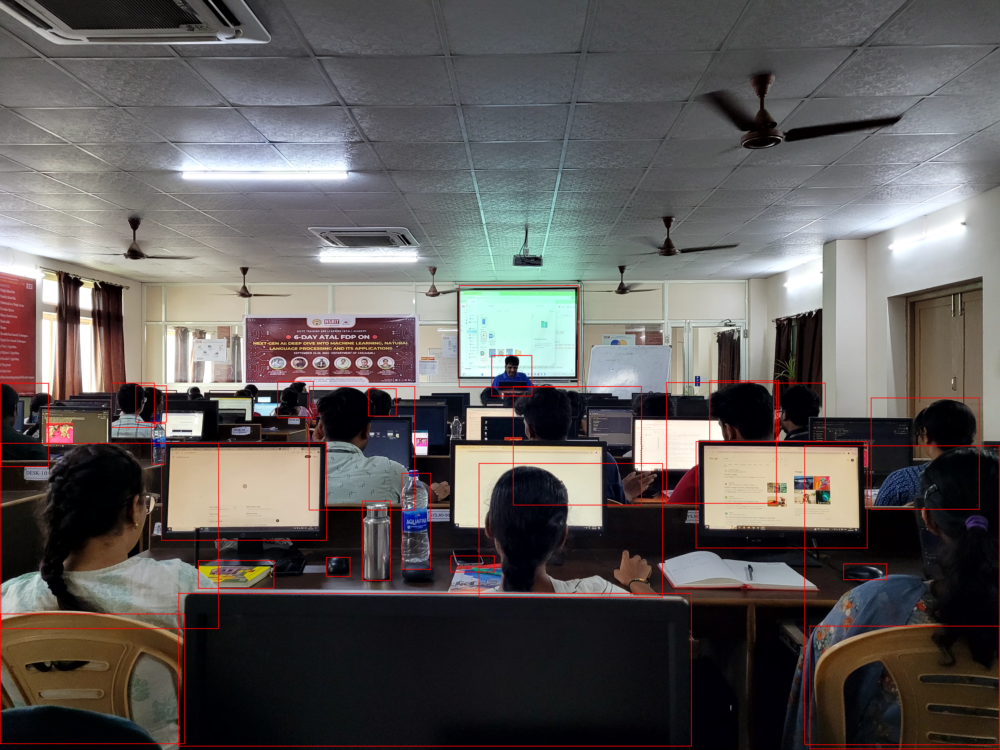

In [ ]:
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch
from PIL import Image, ImageDraw
import requests
from IPython.display import display
import pyheif # import the pyheif library

# Load the image
url = "/content/drive/MyDrive/20240924_100507.heic"

# Convert the HEIC image to RGB using pyheif
heif_file = pyheif.read(url)
image = Image.frombytes(
    heif_file.mode,
    heif_file.size,
    heif_file.data,
    "raw",
    heif_file.mode,
    heif_file.stride,
)

# Load the processor and model
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50", revision="no_timm")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", revision="no_timm")

# Preprocess the image
inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)

# Post-process outputs (bounding boxes and class logits)
target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

# Create a draw object
draw = ImageDraw.Draw(image)

# Loop through detections and draw the bounding boxes
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

    # Draw the rectangle on the image
    draw.rectangle(box, outline="red", width=3)

# Display the image with drawn boxes in Google Colab
display(image)

In [1]:
!jupyter nbconvert --ClearOutputPreprocessor.enabled=True --to notebook --inplace your_notebook.ipynb

[NbConvertApp] WARNING | pattern 'your_notebook.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--execute
 